# Config and Imports

In [12]:
import os, glob, re
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import numpy as np

print("TF:", tf.__version__)
print("GPU devices:", tf.config.list_physical_devices('GPU'))

USE_GPU = True
if not USE_GPU:
    try:
        tf.config.set_visible_devices([], 'GPU')  # fuerza CPU
        print("Forzando CPU (GPU oculto).")
    except Exception as e:
        print("Aviso al ocultar GPU:", e)

# Limpia cualquier gráfico previo (evita fugas de memoria en notebooks)
keras.backend.clear_session()


TF: 2.16.2
GPU devices: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


# Params

In [2]:
IMG_DIR = "oxford-iiit-pet/images"
ANN_DIR = "oxford-iiit-pet/annotations/trimaps"

IMG_SIZE = (128, 128)      # más chico para evitar OOM; luego podés subir a 256
NUM_CLASSES = 3
BATCH = 2                  # subí a 4/8 cuando esté estable
EPOCHS = 5
VAL_SPLIT = 0.1
AUTOTUNE = tf.data.AUTOTUNE # para optimización automática de datos

# Funciones para cargar DataSets

In [3]:
# ======================= LISTADO DE PARES =======================
def list_pairs(img_dir, ann_dir):
    # Recolectar jpg/jpeg/png para imágenes
    img_paths = []
    for ext in ("*.jpg","*.jpeg","*.png"):
        img_paths += glob.glob(os.path.join(img_dir, ext))
    if not img_paths:
        raise RuntimeError("No se encontraron imágenes en " + img_dir)

    # Filtra .mat y cualquier cosa rara
    img_paths = [p for p in img_paths if not p.lower().endswith(".mat")]
    img_paths.sort()

    # Construye el path de la máscara a partir del basename (Oxford: PNG)
    pairs = []
    for ip in img_paths:
        base = os.path.splitext(os.path.basename(ip))[0] 
        cand = os.path.join(ann_dir, base + ".png")

        if os.path.exists(cand):
            pairs.append((ip, cand))
        else:
            print("[WARN] Falta máscara para:", ip)
    if not pairs:
        raise RuntimeError("No se encontraron pares imagen+máscara. Revisá rutas.")

    return pairs # devuelve pares (imagen, máscara) que son: (img_path, mask_path)

pairs_all = list_pairs(IMG_DIR, ANN_DIR)
n_total = len(pairs_all)
n_val = max(1, int(n_total * VAL_SPLIT))
pairs_val = pairs_all[:n_val]
pairs_tr  = pairs_all[n_val:]

print(f"Total pares: {n_total} | Train: {len(pairs_tr)} | Val: {len(pairs_val)}")

# ======================= TF DATA LOADERS (sin OpenCV) =======================
def decode_image(path):
    data = tf.io.read_file(path)
    # Imagenes del set son JPG, pero por seguridad uso decode_image (maneja png/jpg)
    img = tf.io.decode_image(data, channels=3, expand_animations=False)
    img = tf.image.convert_image_dtype(img, tf.float32)  # [0,1]
    return img  # (H,W,3) float32

def decode_mask(path):
    data = tf.io.read_file(path)
    mask = tf.io.decode_png(data, channels=1)  # trimaps -> PNG, 1 canal
    # mask: uint8 con valores {1,2,3}; mapeo a {0,1,2}
    mask = tf.cast(mask, tf.int32)
    mask = tf.squeeze(mask, axis=-1)           # (H,W)
    mask = tf.clip_by_value(mask - 1, 0, NUM_CLASSES-1)
    return mask  # (H,W) int32

def preprocess(img, mask, img_size=IMG_SIZE):
    # Resize: imagen bilinear (o area), máscara NEAREST para no mezclar etiquetas
    img  = tf.image.resize(img,  img_size, method=tf.image.ResizeMethod.BILINEAR)
    mask = tf.image.resize(mask[..., tf.newaxis], img_size,
                           method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    mask = tf.squeeze(mask, axis=-1)           # (H,W), int32
    return img, mask

def make_ds(pairs, batch_size=BATCH, shuffle=True):
    img_paths = tf.constant([p[0] for p in pairs])
    ann_paths = tf.constant([p[1] for p in pairs])

    ds = tf.data.Dataset.from_tensor_slices((img_paths, ann_paths))
    if shuffle:
        ds = ds.shuffle(min(len(pairs), 1000), reshuffle_each_iteration=True)

    def _load_map(ip, ap):
        img  = decode_image(ip)
        mask = decode_mask(ap)
        img, mask = preprocess(img, mask, IMG_SIZE)
        # Set shapes explícitas para que Keras infiera bien
        img.set_shape((IMG_SIZE[0], IMG_SIZE[1], 3))
        mask.set_shape((IMG_SIZE[0], IMG_SIZE[1]))
        return img, mask

    ds = ds.map(_load_map, num_parallel_calls=AUTOTUNE)
    ds = ds.batch(batch_size, drop_remainder=False)
    # Prefetch limitado; a veces AUTOTUNE + Metal puede ser agresivo
    ds = ds.prefetch(1)
    return ds


Total pares: 7390 | Train: 6651 | Val: 739


# DataSets

In [4]:
train_ds = make_ds(pairs_tr, BATCH, shuffle=True)
val_ds   = make_ds(pairs_val, BATCH, shuffle=False)

2025-11-14 10:17:59.211224: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1
2025-11-14 10:17:59.211254: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2025-11-14 10:17:59.211300: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.92 GB
2025-11-14 10:17:59.211330: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2025-11-14 10:17:59.211391: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


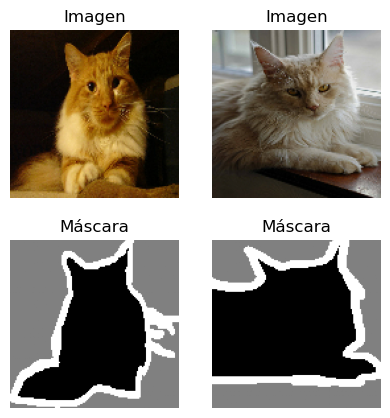

2025-11-14 10:19:08.217348: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [7]:
# plotear un ejemplos de entrenamiento
for images, masks in train_ds.take(1):
    plt.figure(figsize=(10, 5))
    for i in range(min(BATCH, 4)):
        plt.subplot(2, 4, i+1)
        plt.imshow(images[i])
        plt.title("Imagen")
        plt.axis('off')

        plt.subplot(2, 4, i+5)
        plt.imshow(masks[i], cmap='gray', vmin=0, vmax=NUM_CLASSES-1)
        plt.title("Máscara")
        plt.axis('off')
    plt.show()

# Modelo

In [8]:
def conv_block(x, filters):
    x = layers.Conv2D(filters, 3, padding="same", kernel_initializer="he_normal")(x)
    x = layers.Activation("relu")(x)
    return x

# def convmato
# con 2d
# batchnorm
# leak relu



def up_block(x, skip, filters):
    x = layers.UpSampling2D((2,2))(x)
    x = layers.Conv2D(filters, 2, padding="same")(x)
    x = layers.Concatenate()([x, skip])
    x = conv_block(x, filters)
    return x


def build_unet(input_shape=(128,128,3), num_classes=3, base=16):  # base 16 para bajar memoria
    inputs = layers.Input(shape=input_shape)
    # Encoder
    c1 = conv_block(inputs, base)        ; p1 = layers.MaxPooling2D(2)(c1)  # 64
    c2 = conv_block(p1, base*2)          ; p2 = layers.MaxPooling2D(2)(c2)  # 32
    c3 = conv_block(p2, base*4)          ; p3 = layers.MaxPooling2D(2)(c3)  # 16
    # Bottleneck
    bn = conv_block(p3, base*8)
    # Decoder
    u6 = up_block(bn, c3, base*4)
    u7 = up_block(u6, c2, base*2)
    u8 = up_block(u7, c1, base)
    # Salida
    outputs = layers.Conv2D(num_classes, 1, activation="softmax")(u8)
    return keras.Model(inputs, outputs, name="UNet_tiny")

model = build_unet(input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3),
                   num_classes=NUM_CLASSES, base=16)

model.compile(
    optimizer=keras.optimizers.Adam(1e-3),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

model.summary()

Model: "UNet_tiny"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 128, 128,  │        448 │ input_layer[0][0] │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 128, 128,  │          0 │ conv2d[0][0]      │
│ (Activation)        │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 64, 64,    │          0 │ activation[0][0]  │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 64, 64,    │      4,640 │ max_pooling2d[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 64, 64,    │          0 │ conv2d_1[0][0]    │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 32, 32,    │          0 │ activation_1[0][… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 32, 32,    │     18,496 │ max_pooling2d_1[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 32, 32,    │          0 │ conv2d_2[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 16, 16,    │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 16, 16,    │     73,856 │ max_pooling2d_2[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 16, 16,    │          0 │ conv2d_3[0][0]    │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d       │ (None, 32, 32,    │          0 │ activation_3[0][… │
│ (UpSampling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 32, 32,    │     32,832 │ up_sampling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 32, 32,    │          0 │ conv2d_4[0][0],   │
│ (Concatenate)       │ 128)              │            │ activation_2[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 32, 32,    │     73,792 │ concatenate[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 32, 32,    │          0 │ conv2d_5[0][0]  

 Total params: 237,491 (927.70 KB)

 Trainable params: 237,491 (927.70 KB)

 Non-trainable params: 0 (0.00 B)

#   Train

In [6]:
callbacks = [
    keras.callbacks.EarlyStopping(monitor="val_loss", patience=3, restore_best_weights=True),
    keras.callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=2, min_lr=1e-5),
]

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    callbacks=callbacks
)

Epoch 1/5


2025-11-04 23:22:24.198722: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


 721/3326 ━━━━━━━━━━━━━━━━━━━━ 5:08 119ms/step - accuracy: 0.6365 - loss: 0.8448

Corrupt JPEG data: premature end of data segment


 881/3326 ━━━━━━━━━━━━━━━━━━━━ 4:49 118ms/step - accuracy: 0.6444 - loss: 0.8303

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


3326/3326 ━━━━━━━━━━━━━━━━━━━━ 401s 120ms/step - accuracy: 0.7599 - loss: 0.5959 - val_accuracy: 0.7687 - val_loss: 0.5879 - learning_rate: 0.0010
Epoch 2/5
 800/3326 ━━━━━━━━━━━━━━━━━━━━ 4:56 117ms/step - accuracy: 0.7779 - loss: 0.5621

Corrupt JPEG data: premature end of data segment


1556/3326 ━━━━━━━━━━━━━━━━━━━━ 3:27 117ms/step - accuracy: 0.7828 - loss: 0.5496

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


3326/3326 ━━━━━━━━━━━━━━━━━━━━ 398s 120ms/step - accuracy: 0.8134 - loss: 0.4769 - val_accuracy: 0.8034 - val_loss: 0.4919 - learning_rate: 0.0010
Epoch 3/5
 902/3326 ━━━━━━━━━━━━━━━━━━━━ 5:11 128ms/step - accuracy: 0.8042 - loss: 0.5000

Corrupt JPEG data: premature end of data segment


1487/3326 ━━━━━━━━━━━━━━━━━━━━ 3:54 127ms/step - accuracy: 0.8063 - loss: 0.4944

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


3326/3326 ━━━━━━━━━━━━━━━━━━━━ 415s 125ms/step - accuracy: 0.8273 - loss: 0.4435 - val_accuracy: 0.8166 - val_loss: 0.4662 - learning_rate: 0.0010
Epoch 4/5
 671/3326 ━━━━━━━━━━━━━━━━━━━━ 5:52 133ms/step - accuracy: 0.8072 - loss: 0.4916

Corrupt JPEG data: premature end of data segment


2251/3326 ━━━━━━━━━━━━━━━━━━━━ 2:13 124ms/step - accuracy: 0.8179 - loss: 0.4652

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


3326/3326 ━━━━━━━━━━━━━━━━━━━━ 420s 126ms/step - accuracy: 0.8361 - loss: 0.4216 - val_accuracy: 0.7831 - val_loss: 0.5364 - learning_rate: 0.0010
Epoch 5/5
 987/3326 ━━━━━━━━━━━━━━━━━━━━ 4:49 124ms/step - accuracy: 0.8170 - loss: 0.4690

Corrupt JPEG data: premature end of data segment


1784/3326 ━━━━━━━━━━━━━━━━━━━━ 3:10 123ms/step - accuracy: 0.8223 - loss: 0.4547

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


3326/3326 ━━━━━━━━━━━━━━━━━━━━ 407s 122ms/step - accuracy: 0.8425 - loss: 0.4059 - val_accuracy: 0.8140 - val_loss: 0.4672 - learning_rate: 0.0010


In [9]:
import numpy as np

model.save("unet_model.keras")

# Convert history lists to numpy arrays and save as a compressed .npz file
hist_np = {k: np.array(v) for k, v in history.history.items()}
np.savez("unet_training_history.npz", **hist_np)


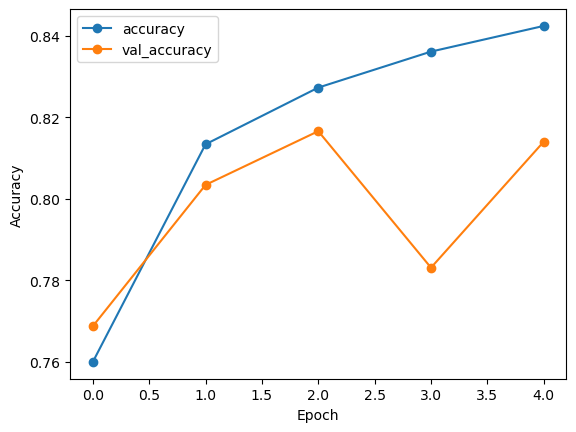

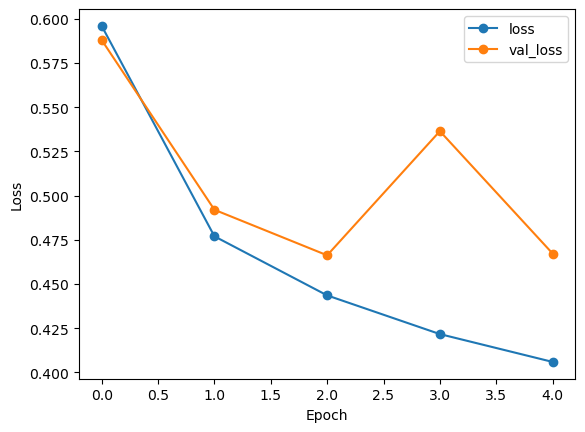

In [15]:
# plot accuracy

# plt.plot(history.history['accuracy'], label='accuracy')
# plt.plot(history.history['val_accuracy'], label='val_accuracy')
# plt.xlabel('Epoch')
# plt.ylabel('Accuracy')
# plt.legend()
# plt.show()

# # plot loss
# plt.plot(history.history['loss'], label='loss')
# plt.plot(history.history['val_loss'], label='val_loss')
# plt.xlabel('Epoch')
# plt.ylabel('Loss')
# plt.legend()
# plt.show()

# plot accuracy and loss from saved files
loaded = np.load("unet_training_history.npz")
plt.plot(loaded['accuracy'],"-o", label='accuracy')
plt.plot(loaded['val_accuracy'],"-o", label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# plot loss
plt.plot(loaded['loss'],"-o", label='loss')
plt.plot(loaded['val_loss'],"-o", label='val_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


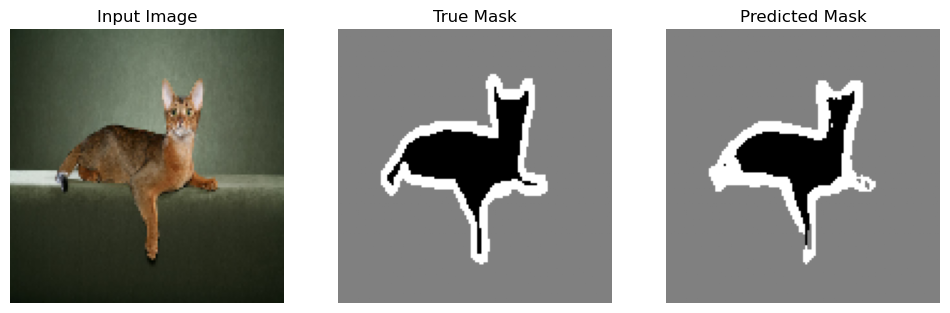

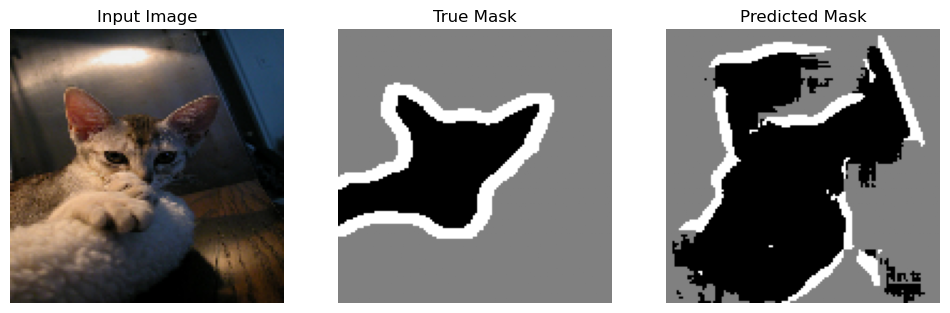

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


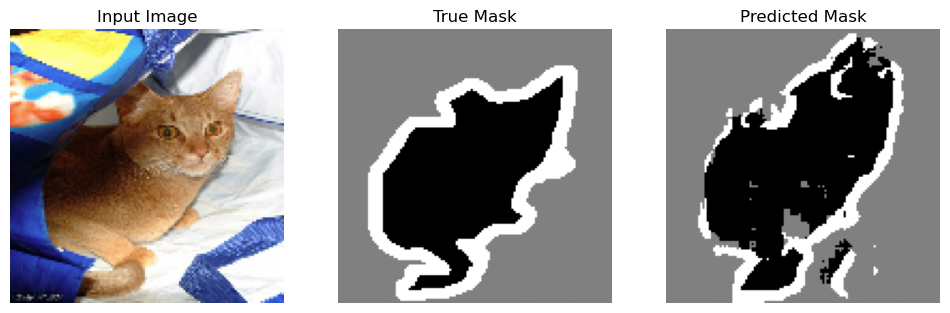

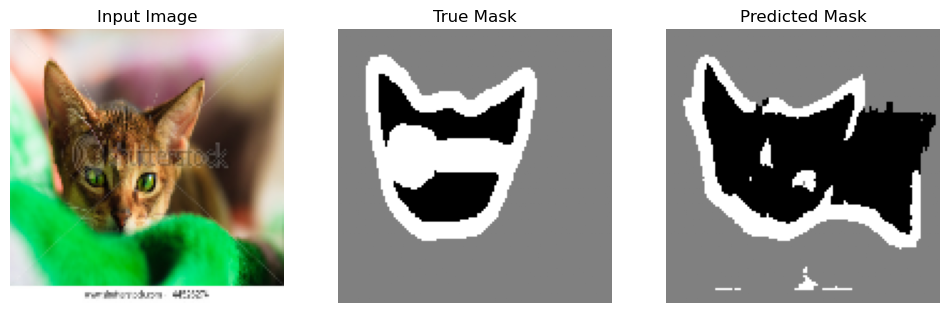

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


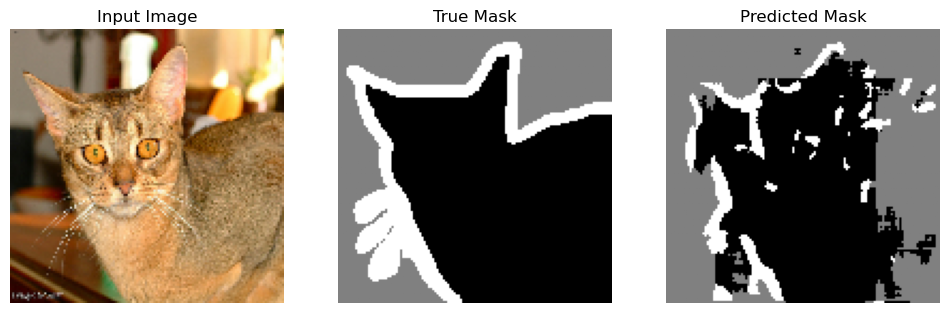

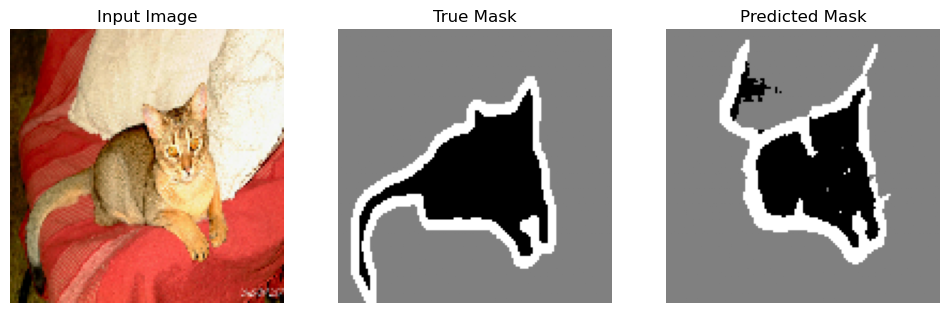

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


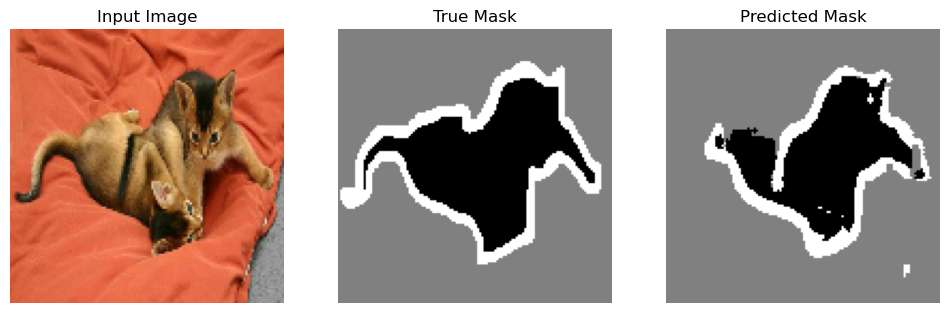

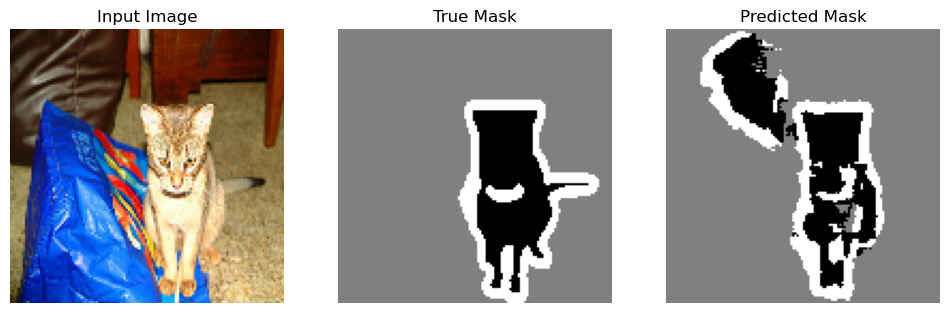

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


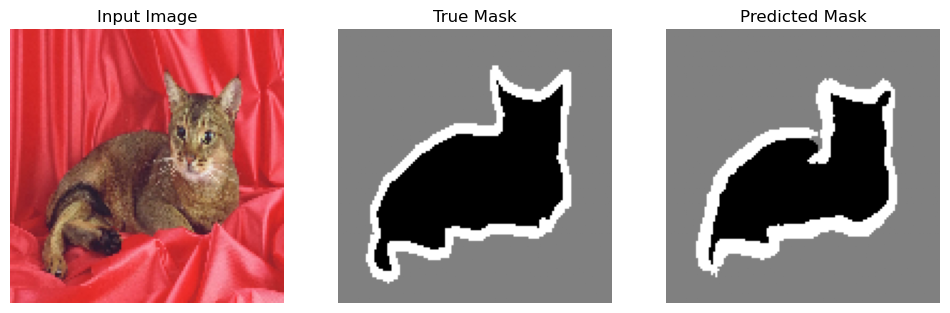

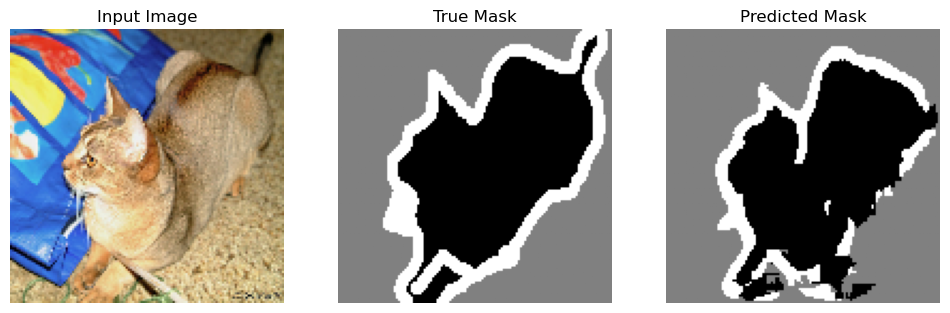

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


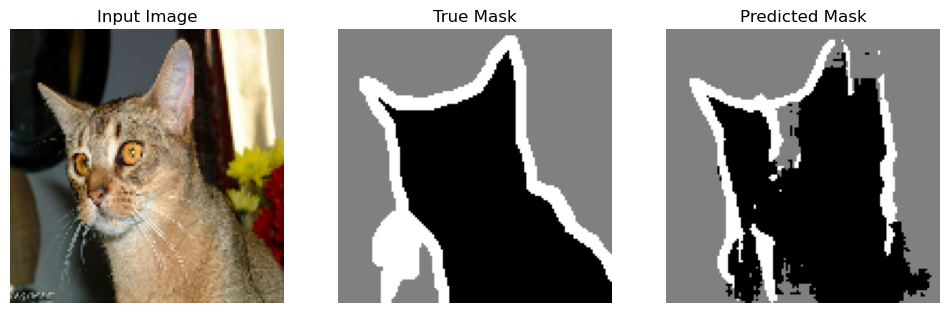

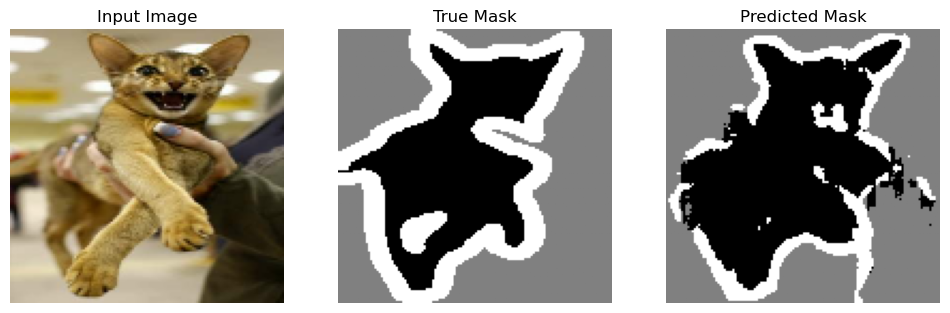

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


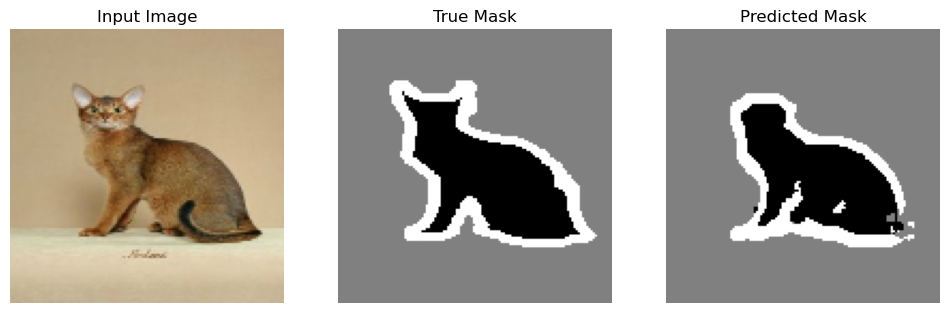

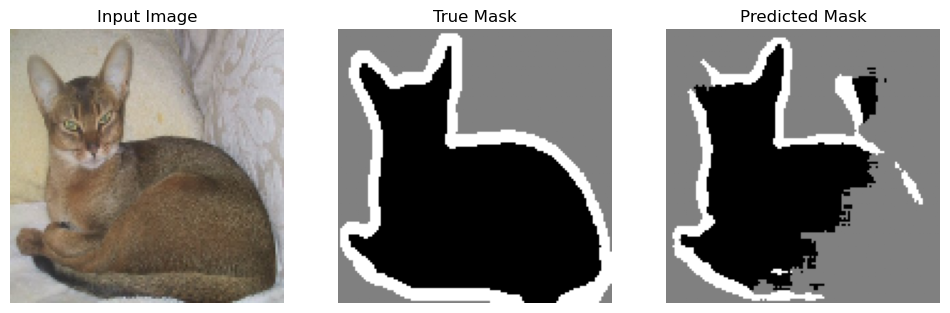

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


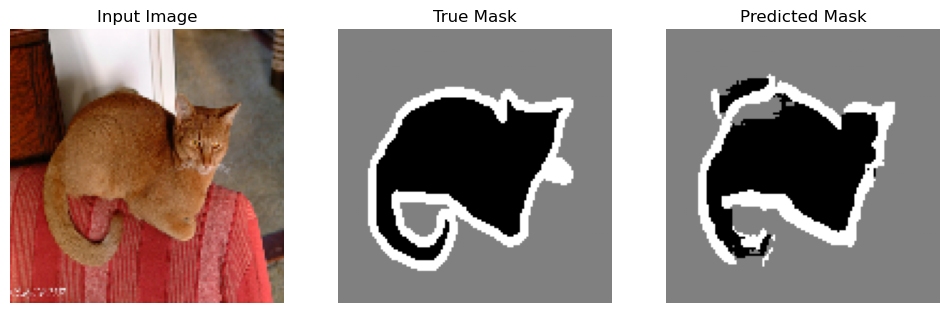

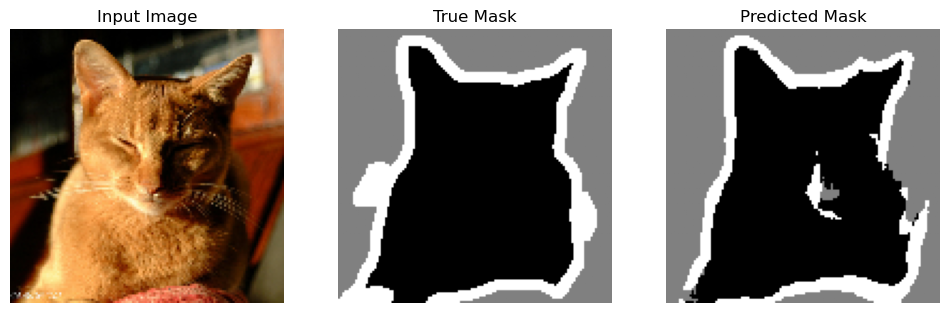

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


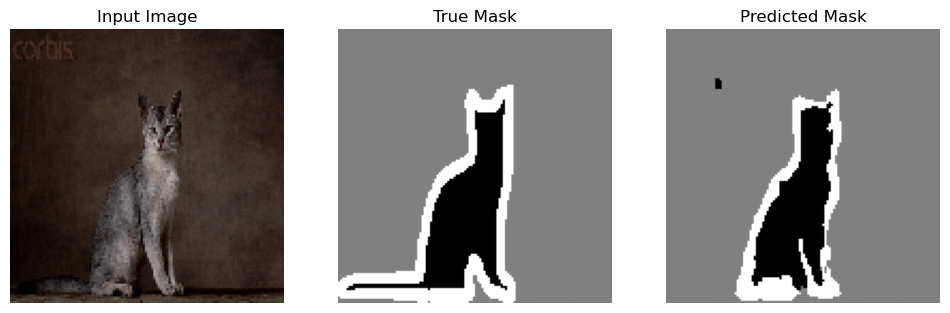

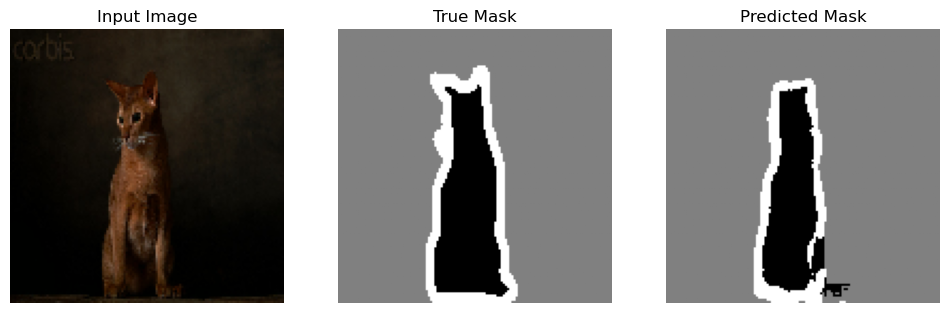

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


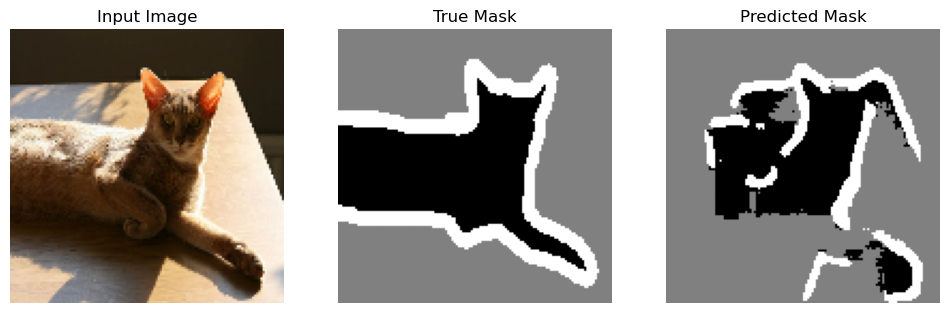

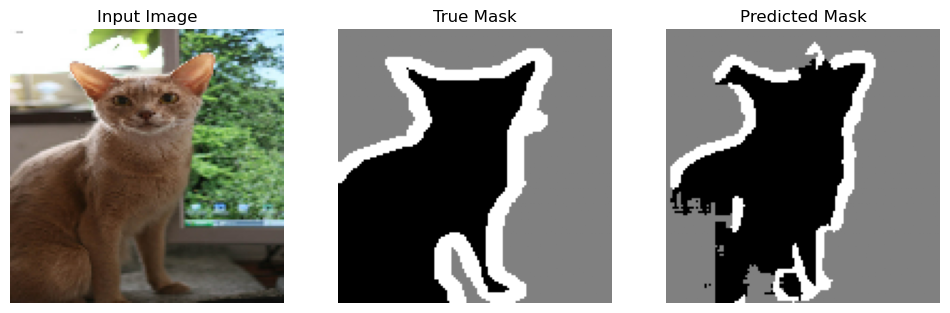

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


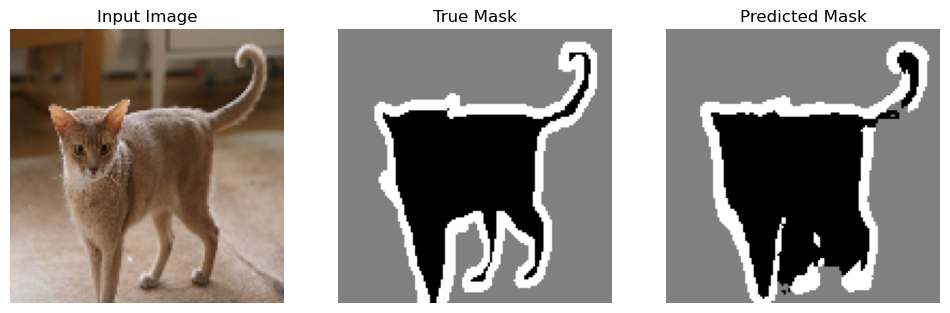

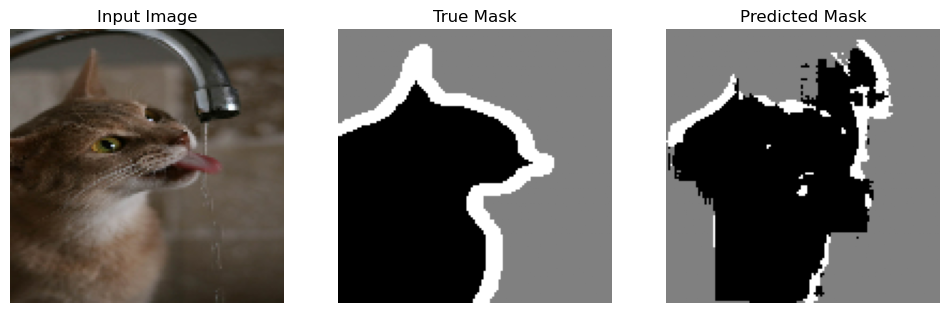

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


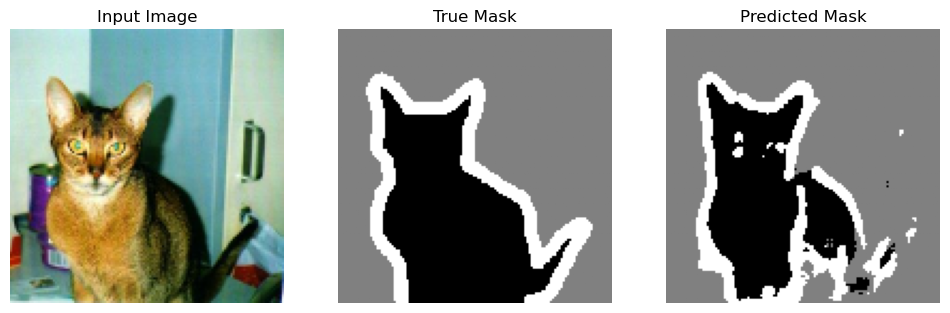

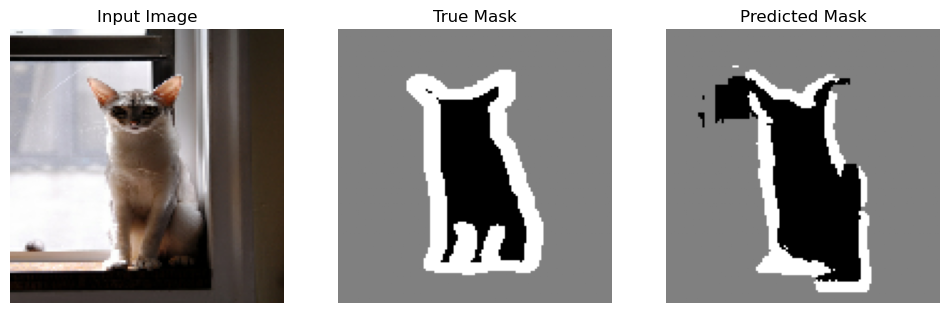

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


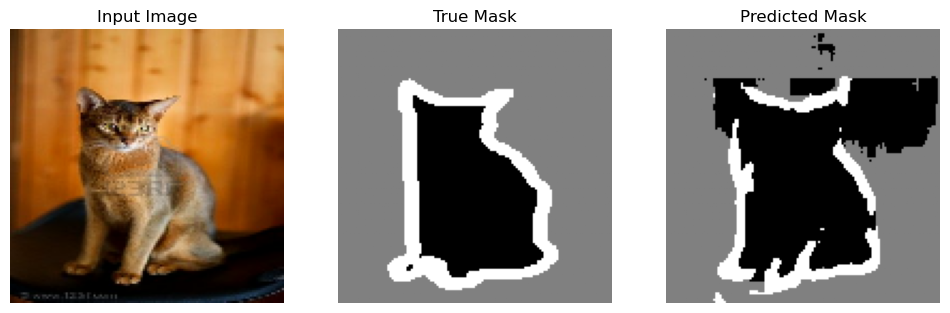

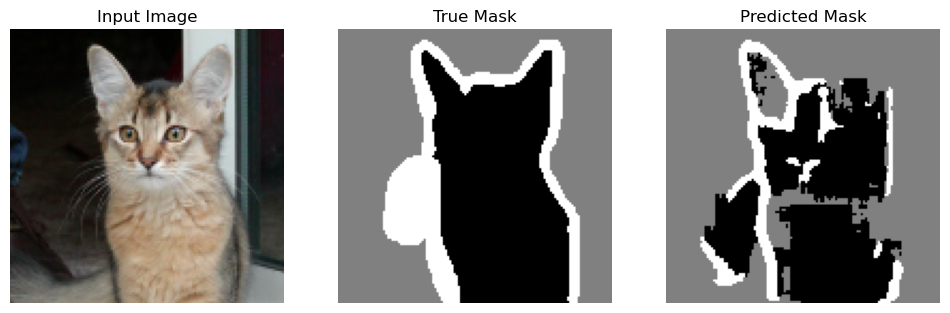

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


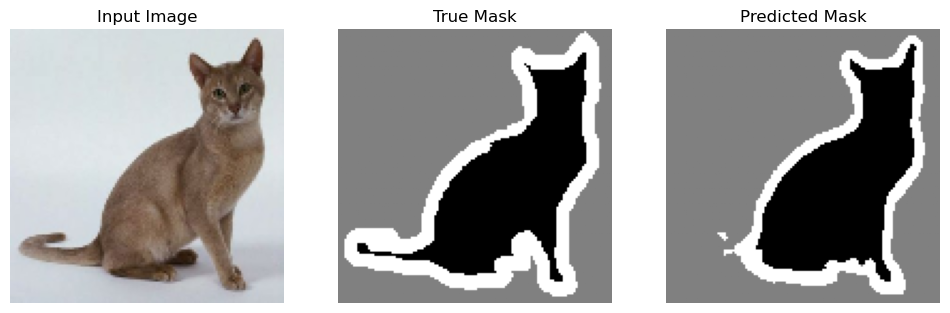

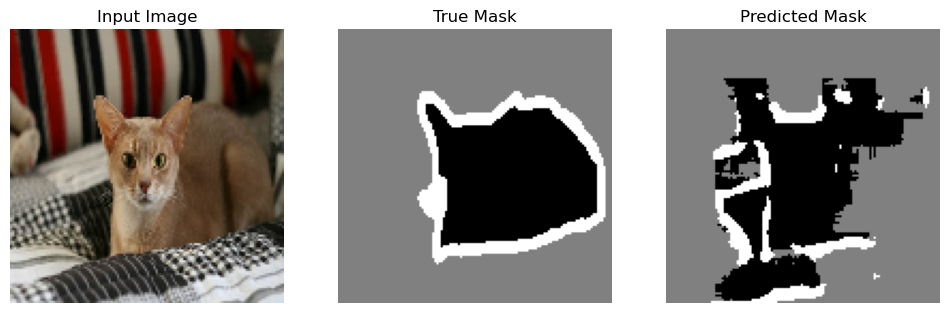

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


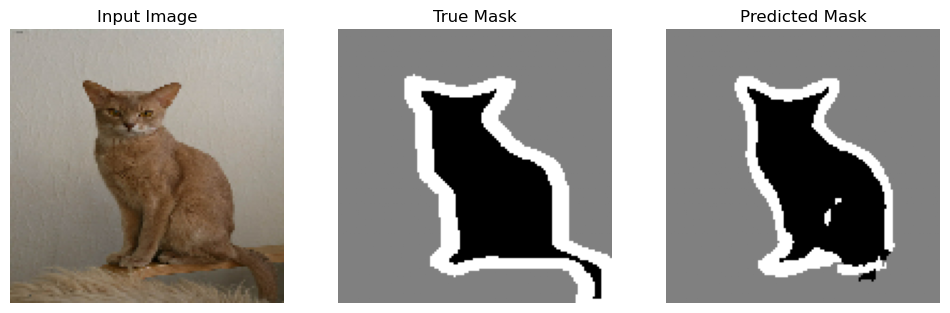

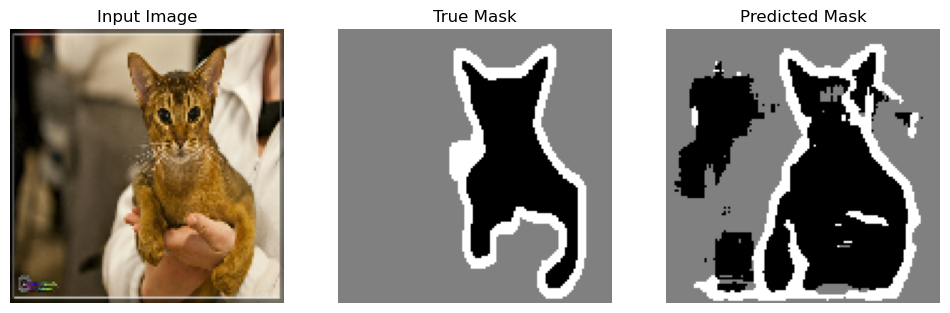

2025-11-14 10:41:31.340232: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [19]:
# open model
loaded_model = keras.models.load_model("unet_model.keras")
# test loaded model on a batch from val_ds, plot input image, true mask and predicted mask
for images, masks in val_ds.take(15):

    preds = loaded_model.predict(images)
    pred_masks = tf.argmax(preds, axis=-1)

    for i in range(images.shape[0]):
        plt.figure(figsize=(12,4))
        plt.subplot(1,3,1)
        plt.imshow(images[i])
        plt.title("Input Image")
        plt.axis("off")

        plt.subplot(1,3,2)
        plt.imshow(masks[i], cmap='gray', vmin=0, vmax=NUM_CLASSES-1)
        plt.title("True Mask")
        plt.axis("off")

        plt.subplot(1,3,3)
        plt.imshow(pred_masks[i], cmap='gray', vmin=0, vmax=NUM_CLASSES-1)
        plt.title("Predicted Mask")
        plt.axis("off")

        plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


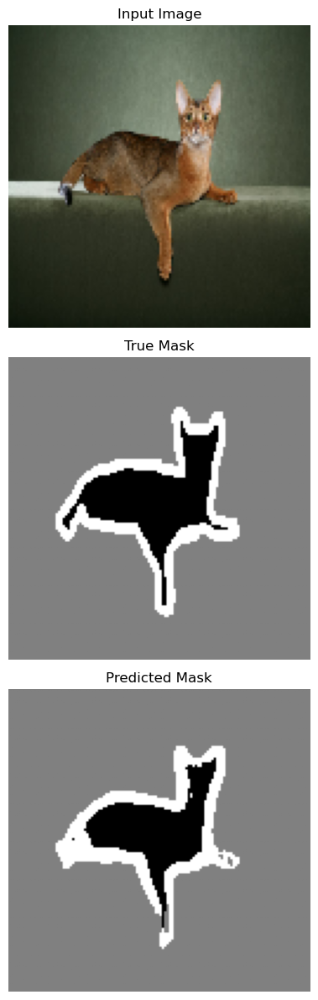

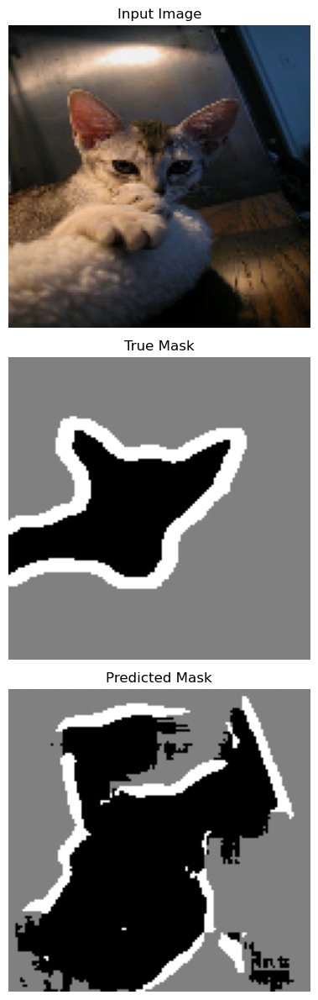

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


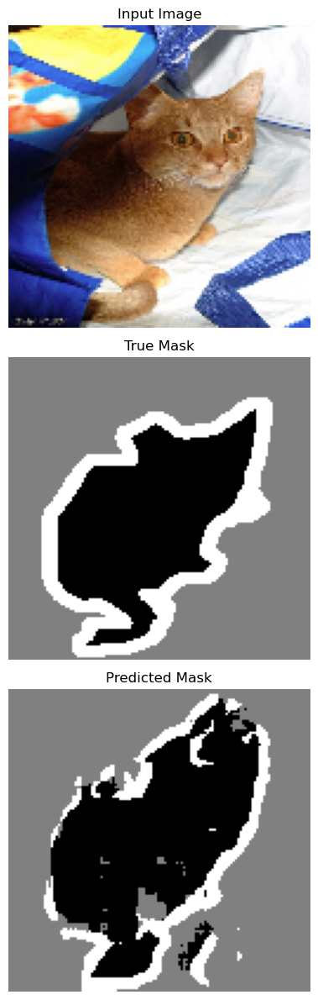

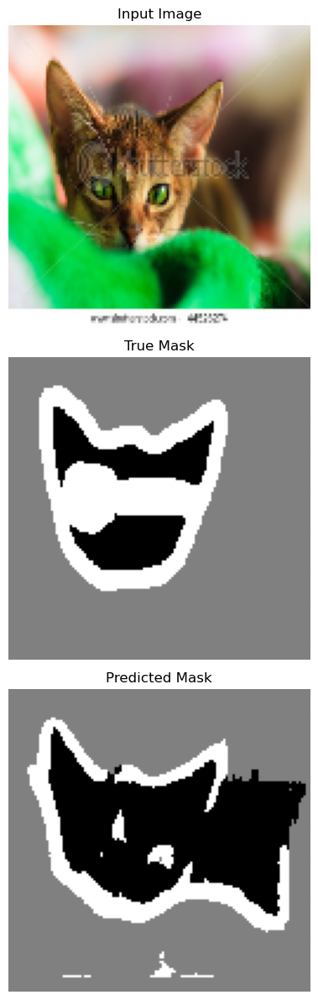

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


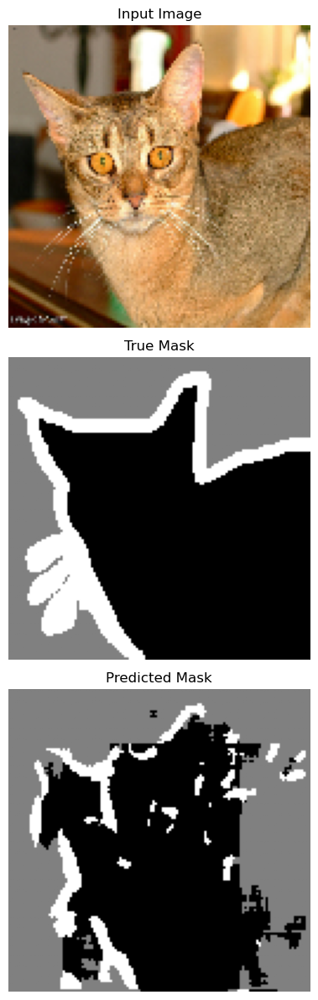

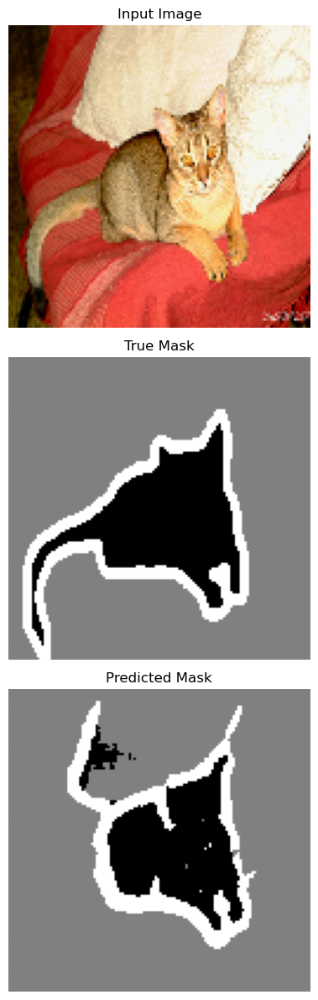

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


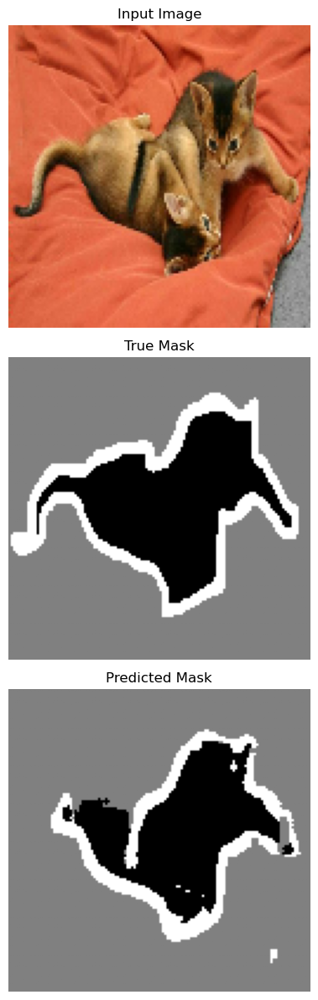

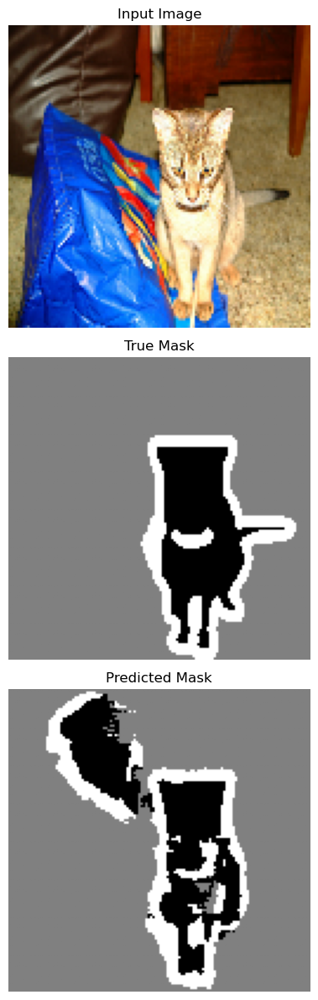

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


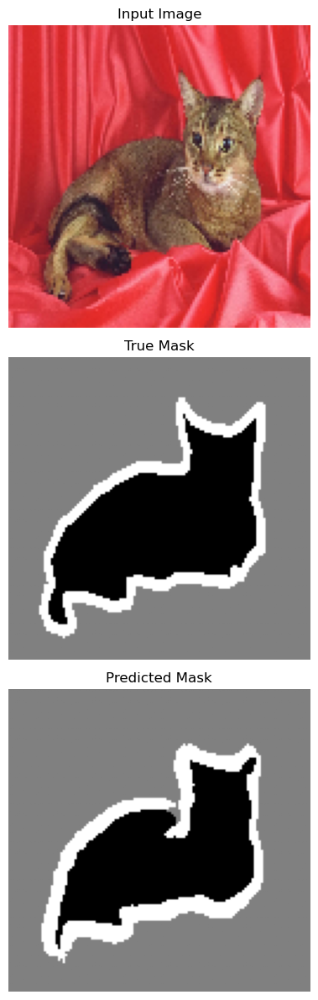

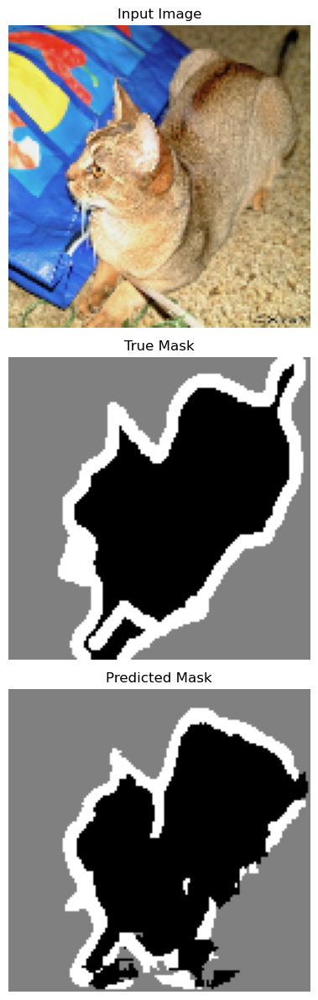

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


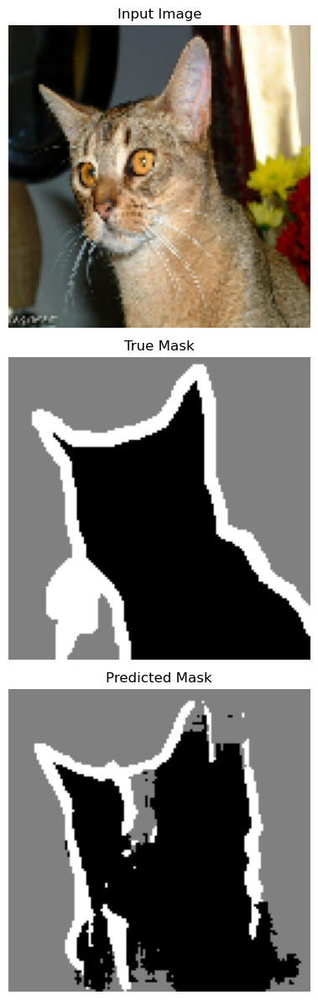

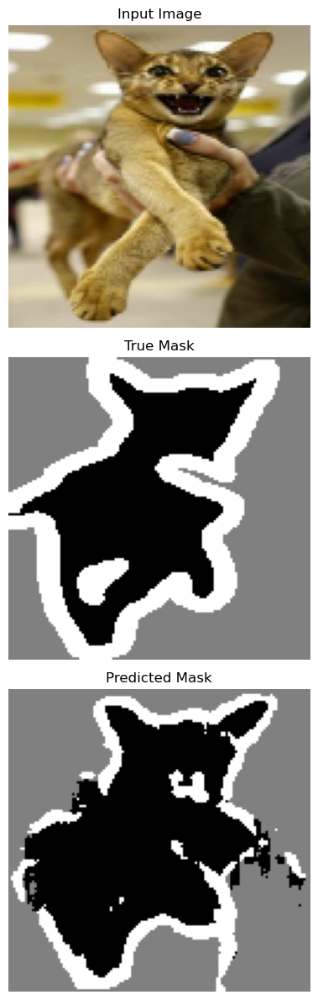

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


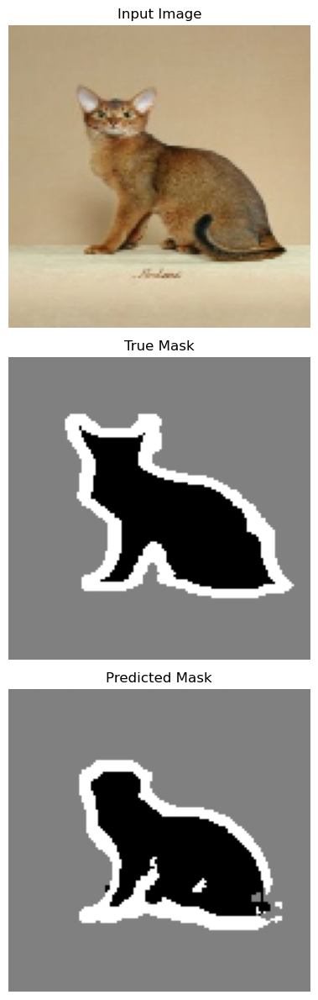

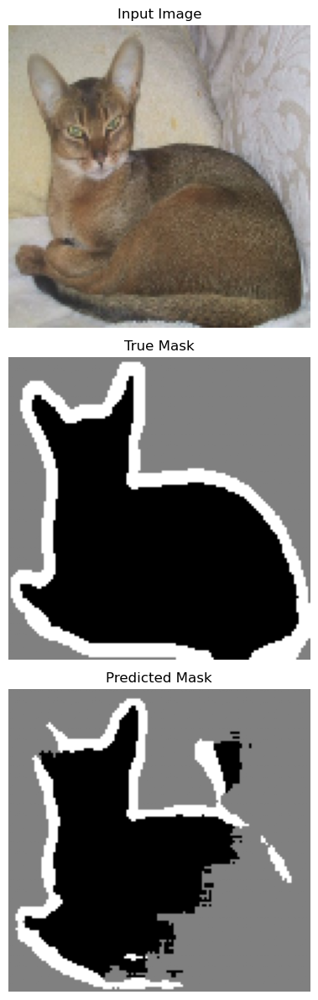

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


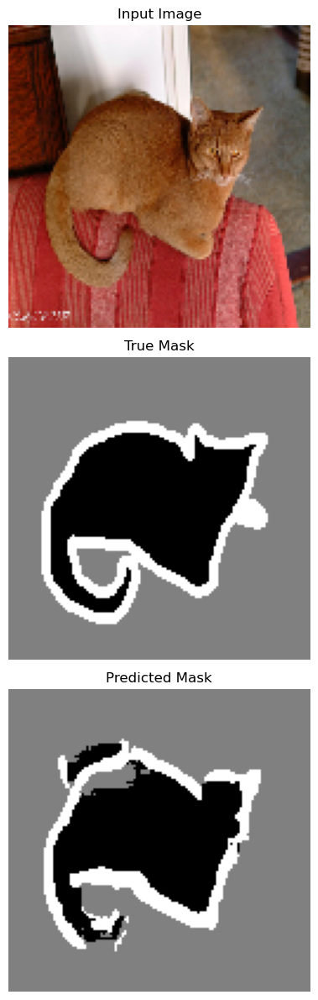

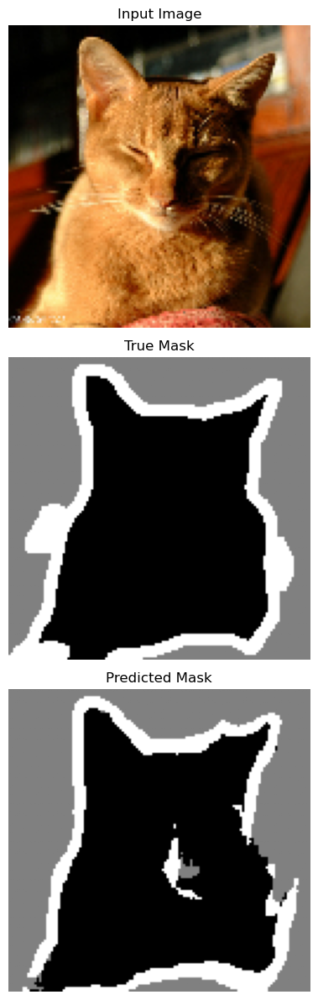

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


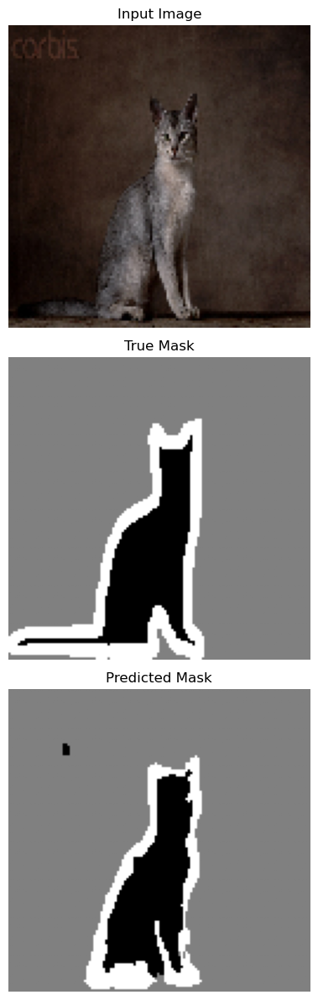

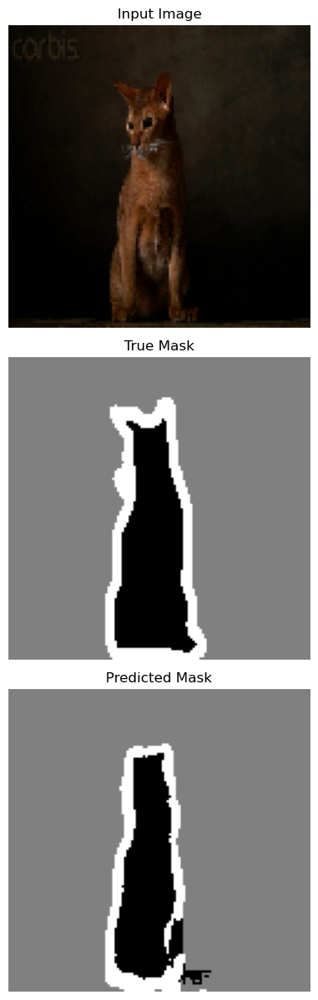

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


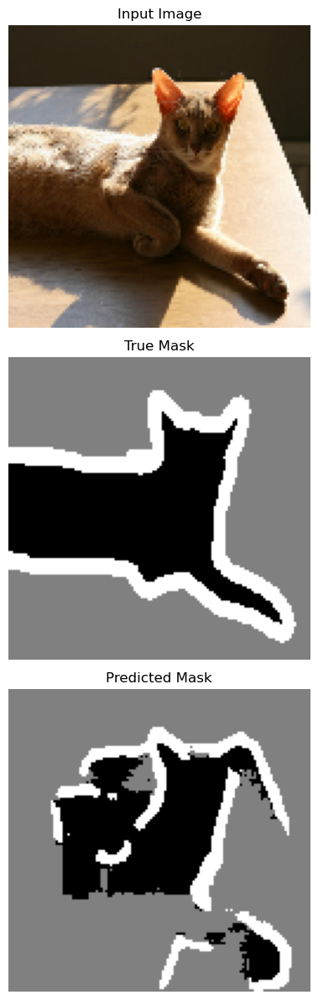

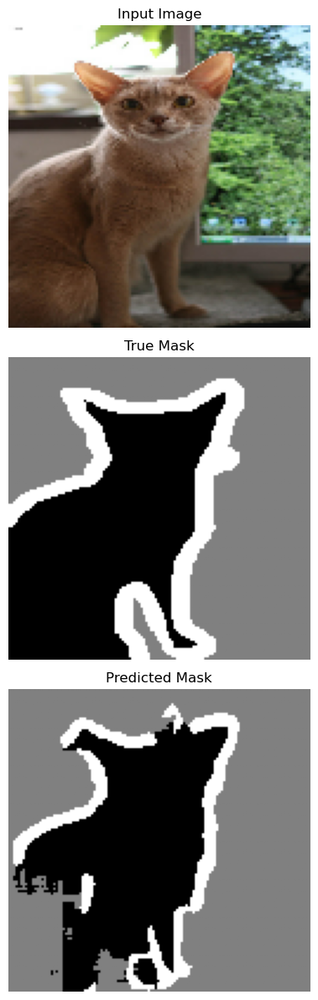

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


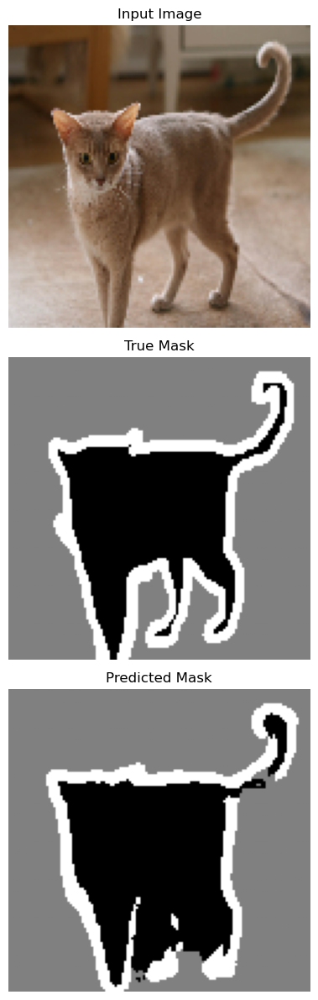

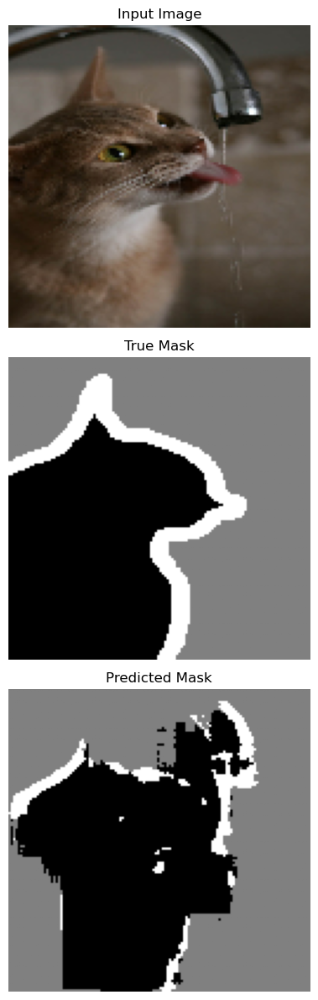

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


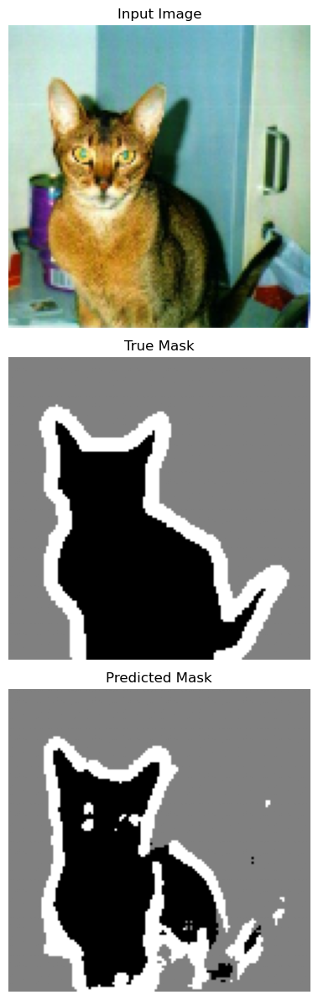

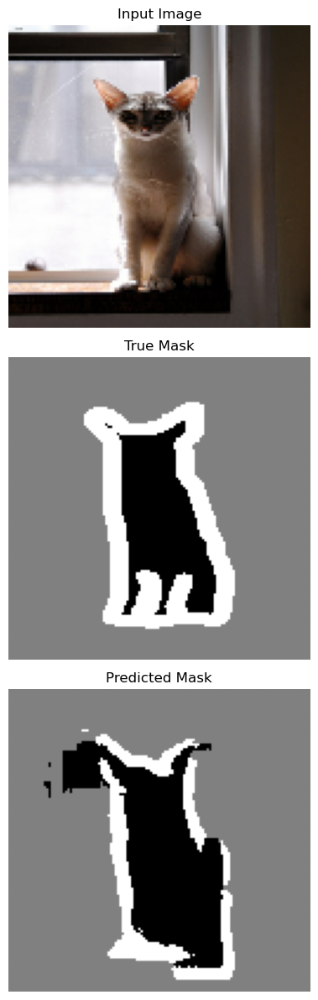

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


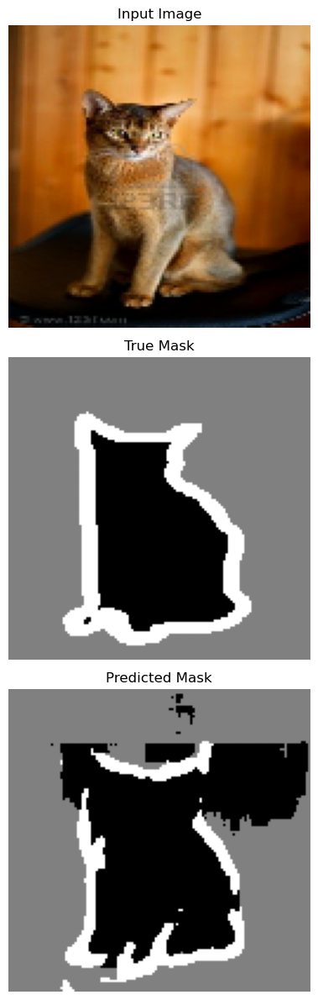

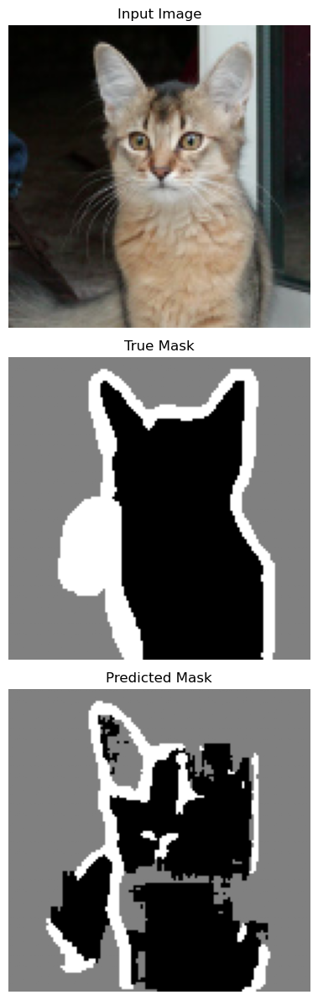

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


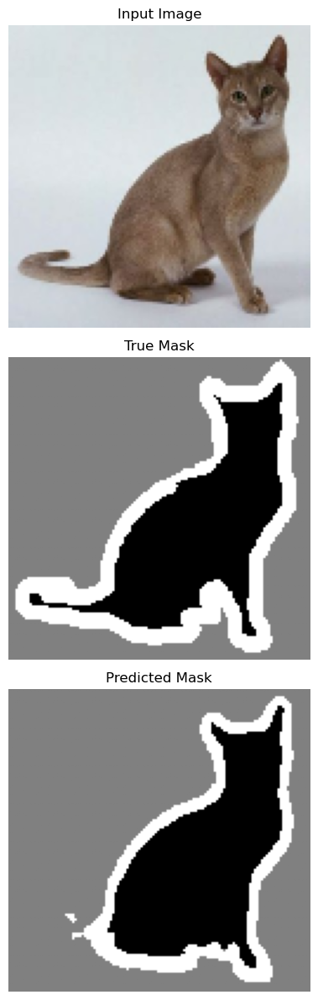

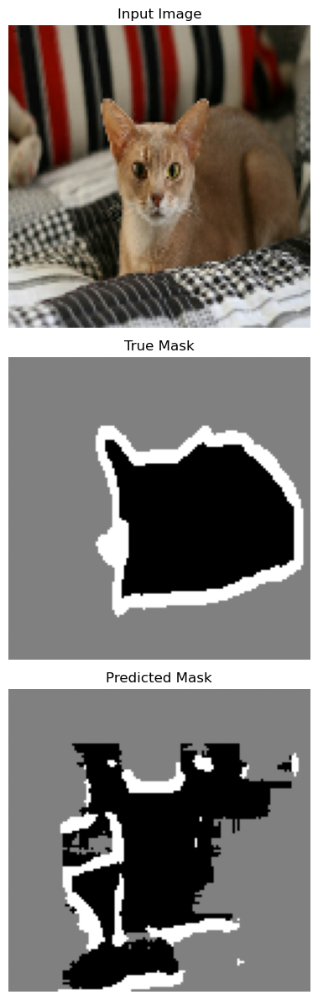

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


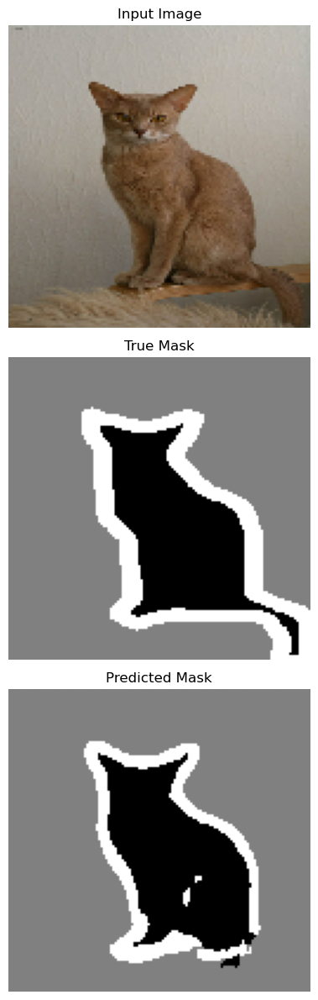

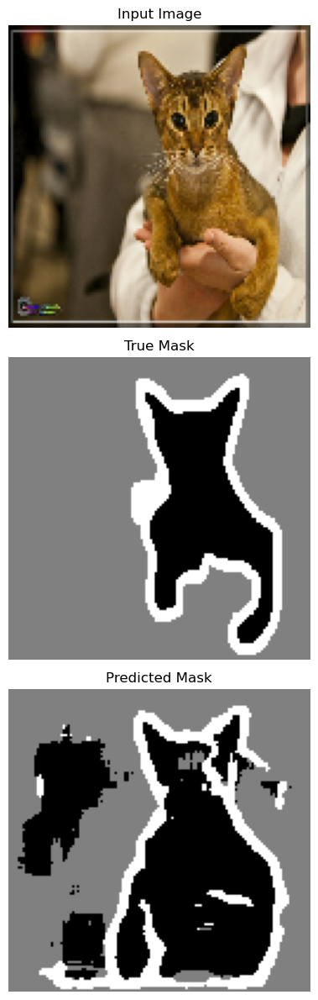

2025-11-14 10:44:15.145610: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [20]:
# open model
loaded_model = keras.models.load_model("unet_model.keras")

# test loaded model on a batch from val_ds, plot input image, true mask and predicted mask
for images, masks in val_ds.take(15):

    preds = loaded_model.predict(images)
    pred_masks = tf.argmax(preds, axis=-1)

    for i in range(images.shape[0]):
        plt.figure(figsize=(6,12))   # más alto, menos ancho

        # Input image
        plt.subplot(3,1,1)
        plt.imshow(images[i])
        plt.title("Input Image")
        plt.axis("off")

        # True mask
        plt.subplot(3,1,2)
        plt.imshow(masks[i], cmap='gray', vmin=0, vmax=NUM_CLASSES-1)
        plt.title("True Mask")
        plt.axis("off")

        # Predicted mask
        plt.subplot(3,1,3)
        plt.imshow(pred_masks[i], cmap='gray', vmin=0, vmax=NUM_CLASSES-1)
        plt.title("Predicted Mask")
        plt.axis("off")

        plt.tight_layout()
        plt.show()
